# Rare-Disease Synthetic Data Augmentation — Day 3: The GAN

Today we build the generative model: a **GAN trained only on the 71 real Dermatofibroma (DF) training images**.
It learns what DF looks like and then creates brand-new DF images. On Day 4 those images are added to the classifier's
training data, exactly like the 500 extras on Day 2.

**The challenge:** GANs normally need thousands of images; we have 71. Three tricks make it workable:

| Trick | What it does |
|---|---|
| **DiffAugment** | Randomly changes colour, shifts and blanks out parts of every image the discriminator sees (real *and* fake), so it can't just memorise the 71 images |
| **Spectral normalisation** | Stops the discriminator from becoming too strong too fast — the main cause of unstable GAN training |
| **EMA generator** | Keeps a smoothed average of the generator's weights, which gives cleaner images |
| **Balanced training** | The discriminator learns 4× faster and takes 2 steps per generator step. In testing, a plain 1:1 setup let the generator "out-run" the discriminator within ~100 iterations, after which it gave no useful feedback |

Plus flips and 90° turns of the real images (skin lesions have no "up"), which turns 71 images into 8 × 71 views.

**Steps:** train the GAN → check it isn't just copying → generate 2,000 candidates → filter out broken ones and copies →
keep 500 → measure realism with **FID**.

**Before running:** upload `rare-disease-aug-day3.zip` to **My Drive** (not a sub-folder). Then `Runtime → Change runtime type → T4 GPU`
and `Runtime → Run all`. Time ≈ 35–45 min (training is about 25–30 min of that). If Colab disconnects, just `Run all` again — training resumes from the last checkpoint.

## 0 · Setup

In [1]:
!nvidia-smi --query-gpu=name,memory.total --format=csv || echo "⚠️ No GPU — Runtime > Change runtime type > T4 GPU"
!pip install -q pytorch-fid

name, memory.total [MiB]
Tesla T4, 15360 MiB


In [2]:
import os, sys, zipfile
from pathlib import Path

try:
    from google.colab import drive
    drive.mount('/content/drive')
except ImportError:
    pass

PROJECT_DIR = Path(os.environ.get('RDA_PROJECT_DIR', '/content/drive/MyDrive/rare-disease-aug'))
RAW_DIR     = Path(os.environ.get('RDA_RAW_DIR', '/content/ham10000_raw'))   # not needed today

# Apply the Day 3 code update. Looks in My Drive and, just in case, in the Colab Notebooks folder.
ZIP_NAME = 'rare-disease-aug-day3.zip'
for folder in [PROJECT_DIR.parent, PROJECT_DIR.parent / 'Colab Notebooks']:
    if (folder / ZIP_NAME).exists():
        zipfile.ZipFile(folder / ZIP_NAME).extractall(PROJECT_DIR.parent)
        print('Code updated from', folder / ZIP_NAME)
        break
assert (PROJECT_DIR / 'src' / 'gan' / 'trainer.py').exists(), f'Upload {ZIP_NAME} to My Drive first'

os.chdir(PROJECT_DIR)
sys.path.insert(0, str(PROJECT_DIR))
print('Project dir:', PROJECT_DIR)

Mounted at /content/drive
Code updated from /content/drive/MyDrive/rare-disease-aug-day3.zip
Project dir: /content/drive/MyDrive/rare-disease-aug


In [3]:
import json
import numpy as np, pandas as pd, torch, matplotlib.pyplot as plt
from IPython.display import display

from src.config import Paths, CLASS_CODES, CLASS_NAMES
from src.data.explore import build_metadata
from src.data.split import make_split
from src.data.preprocess import build_image_cache
from src.data.dataset import attach_cache_index
from src.fid import inception_features, fid_from_features, matched_fid
from src.gan.trainer import GANConfig, train_gan, generate, load_generator, resize_uint8
from src.gan.filtering import select_synthetic, replace_rejected, real_real_nn, gen_real_nn
from src.gan.viz import show_image, image_rows, numbered_grid, plot_gan_history, plot_nn_distances, show_nn_pairs

pd.set_option('display.width', 160)
paths = Paths(PROJECT_DIR, RAW_DIR)
FIG = paths.figures_dir
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'torch {torch.__version__} | device: {DEVICE}')

torch 2.11.0+cu128 | device: cuda


## 1 · The GAN's training data: real DF **training** images only

Validation and test images are never shown to the GAN, so the Day 4 test stays fair.
The GAN works at 128×128 pixels (a good balance between detail and what 71 images can support).

[reuse] raw data not on disk; loading saved /content/drive/MyDrive/rare-disease-aug/data/processed/metadata.csv
[reuse] existing split /content/drive/MyDrive/rare-disease-aug/data/splits/split_seed42.csv
[reuse] image cache /content/drive/MyDrive/rare-disease-aug/data/processed/images_224px_uint8.npy  shape=(10015, 224, 224, 3)
Loading images_224px_uint8.npy into RAM ...
GAN training set: 71 real DF images from 51 lesions, at 128×128
Held-out real DF (val+test): 44 images — used ONLY as a reference for FID, never for training or choosing anything


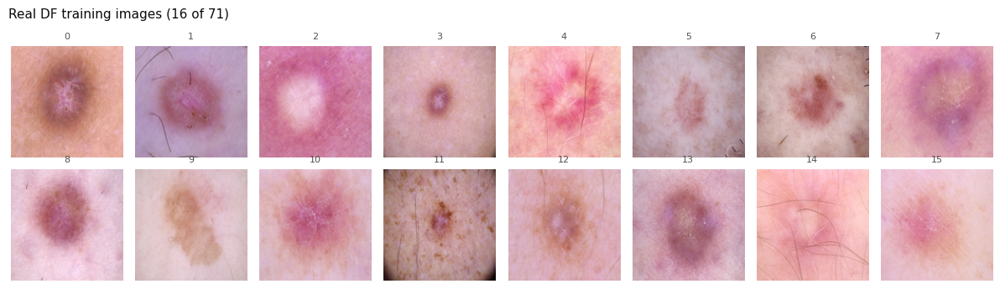

In [4]:
info = json.loads(paths.dataset_info_json.read_text())
RARE = info['rare_class']

meta = build_metadata(paths)
split = make_split(meta, paths, seed=42)             # the fixed Day 1 split
images = build_image_cache(meta, paths, size=224)
split = attach_cache_index(split, meta)

train_rare = split[(split.split == 'train') & (split.label == RARE)].reset_index(drop=True)
heldout_rare = split[(split.split != 'train') & (split.label == RARE)].reset_index(drop=True)   # FID reference only

IMG = 128
real128 = resize_uint8(np.stack([images[i] for i in train_rare.cache_idx]), IMG)
heldout128 = resize_uint8(np.stack([images[i] for i in heldout_rare.cache_idx]), IMG)
lesions = train_rare.lesion_id.to_numpy()

print(f'GAN training set: {len(real128)} real {RARE} images from {len(set(lesions))} lesions, at {IMG}×{IMG}')
print(f'Held-out real {RARE} (val+test): {len(heldout128)} images — used ONLY as a reference for FID, never for training or choosing anything')
numbered_grid(real128[:16], f'Real {RARE} training images (16 of {len(real128)})', out=FIG / 'day3_real_training_examples.png')

## 2 · FID reference: how different are two sets of *real* DF images?

FID measures how statistically similar two image sets are (lower = more similar). With so few images, FID values are much
higher than the ones in GAN papers, so on their own they mean little. We calibrate them: the FID between the **held-out real DF
images and the training DF images** is roughly the best a perfect generator could score at this sample size.

In [5]:
f_train = inception_features(real128, DEVICE)
f_heldout = inception_features(heldout128, DEVICE)
FID_REAL_REF = fid_from_features(f_heldout, f_train)
N_REF = len(heldout128)
print(f'Reference FID (real held-out {RARE}, n={N_REF}  vs  real training {RARE}, n={len(real128)}): {FID_REAL_REF:.1f}')

Downloading: "https://github.com/mseitzer/pytorch-fid/releases/download/fid_weights/pt_inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/pt_inception-2015-12-05-6726825d.pth


100%|██████████| 91.2M/91.2M [00:00<00:00, 447MB/s]


Reference FID (real held-out DF, n=44  vs  real training DF, n=71): 118.2


## 3 · Train the GAN

Every 2,000 iterations you'll see a grid of 32 samples (always from the same random inputs, so you can watch them improve)
and the FID. The generator with the best FID is saved to Drive as `models/gan_DF/G_best.pt`.

**What to look for in the grids:** early on, colour blobs → then skin-like texture → then lesion-like spots.
If many images in a grid look identical, that's *mode collapse* (a known GAN failure — tell me if you see it).

Real images: 71 | G params 2.65M | D params 2.80M | device cuda | iterations 0 -> 20000
it    500/20000 | D 1.387 G 0.655 | r_t 0.64 | 1.2 min, ETA 47.0 min
it   1000/20000 | D 1.619 G 0.335 | r_t 0.56 | 2.5 min, ETA 46.9 min
it   1500/20000 | D 1.716 G 0.272 | r_t 0.51 | 3.7 min, ETA 45.9 min


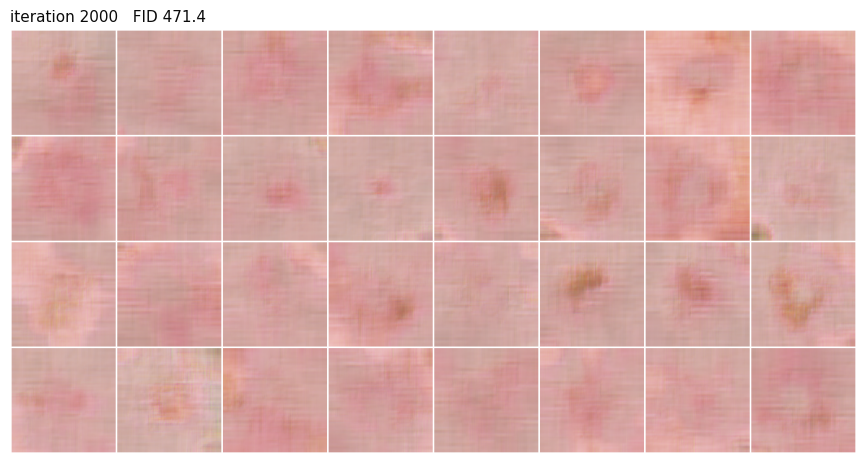

it   2000/20000 | D 1.736 G 0.218 | r_t 0.51 | FID 471.4 | 5.0 min, ETA 45.3 min
it   2500/20000 | D 1.832 G 0.205 | r_t 0.48 | 6.3 min, ETA 44.1 min
it   3000/20000 | D 1.867 G 0.194 | r_t 0.45 | 7.6 min, ETA 42.8 min
it   3500/20000 | D 1.867 G 0.179 | r_t 0.47 | 8.8 min, ETA 41.5 min


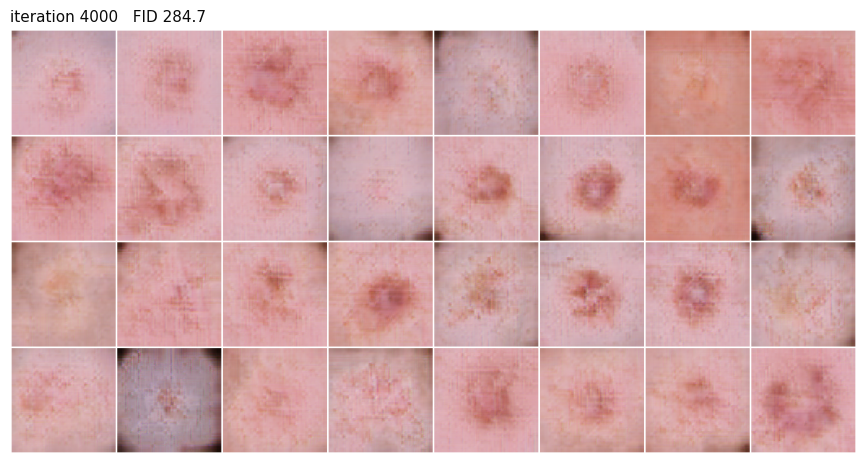

it   4000/20000 | D 1.884 G 0.176 | r_t 0.45 | FID 284.7 | 10.1 min, ETA 40.5 min
it   4500/20000 | D 1.863 G 0.183 | r_t 0.47 | 11.4 min, ETA 39.3 min
it   5000/20000 | D 1.863 G 0.161 | r_t 0.49 | 12.7 min, ETA 38.0 min
it   5500/20000 | D 1.871 G 0.184 | r_t 0.45 | 13.9 min, ETA 36.7 min


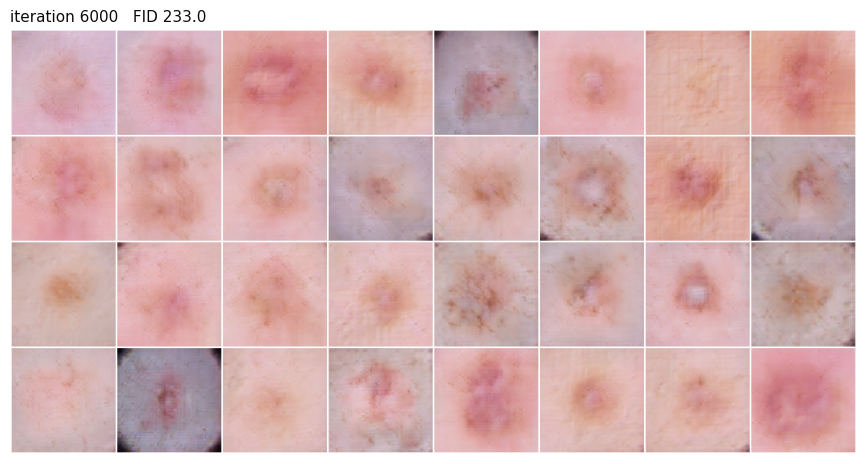

it   6000/20000 | D 1.864 G 0.203 | r_t 0.46 | FID 233.0 | 15.2 min, ETA 35.5 min
it   6500/20000 | D 1.862 G 0.196 | r_t 0.45 | 16.5 min, ETA 34.2 min
it   7000/20000 | D 1.853 G 0.187 | r_t 0.47 | 17.7 min, ETA 33.0 min
it   7500/20000 | D 1.841 G 0.189 | r_t 0.48 | 19.0 min, ETA 31.7 min


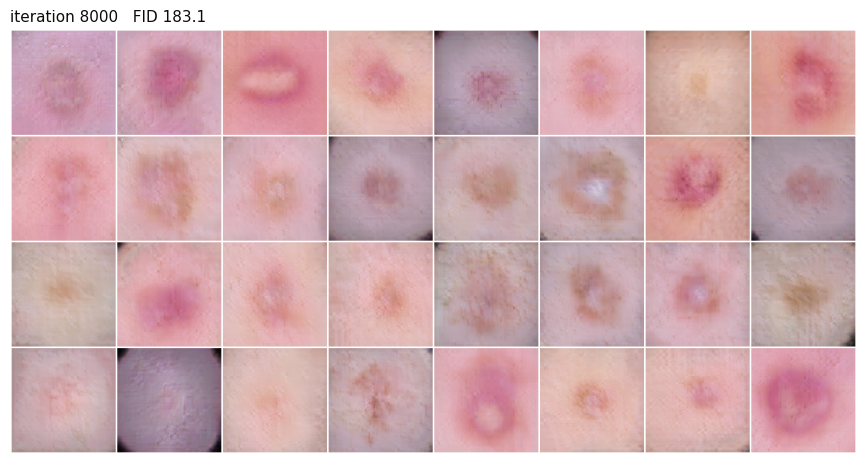

it   8000/20000 | D 1.842 G 0.209 | r_t 0.48 | FID 183.1 | 20.3 min, ETA 30.5 min
it   8500/20000 | D 1.836 G 0.205 | r_t 0.48 | 21.6 min, ETA 29.2 min
it   9000/20000 | D 1.827 G 0.201 | r_t 0.49 | 22.8 min, ETA 27.9 min
it   9500/20000 | D 1.826 G 0.211 | r_t 0.47 | 24.1 min, ETA 26.6 min


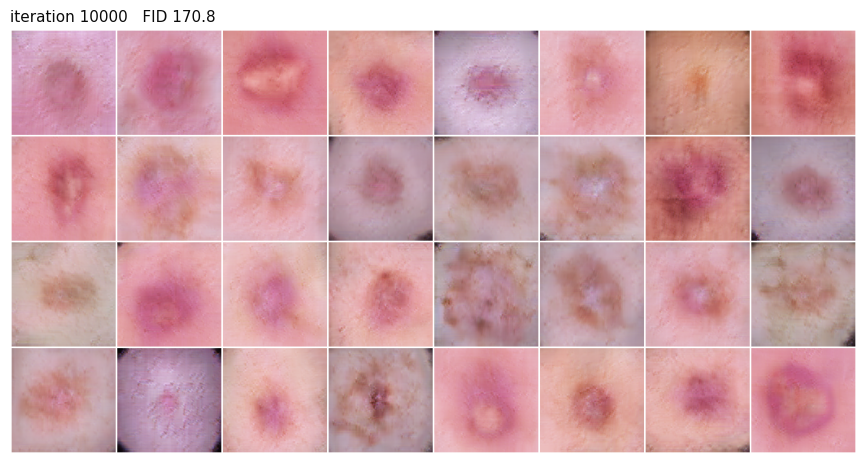

it  10000/20000 | D 1.820 G 0.197 | r_t 0.48 | FID 170.8 | 25.4 min, ETA 25.4 min
it  10500/20000 | D 1.814 G 0.213 | r_t 0.47 | 26.7 min, ETA 24.1 min
it  11000/20000 | D 1.807 G 0.211 | r_t 0.48 | 27.9 min, ETA 22.9 min
it  11500/20000 | D 1.816 G 0.213 | r_t 0.48 | 29.2 min, ETA 21.6 min


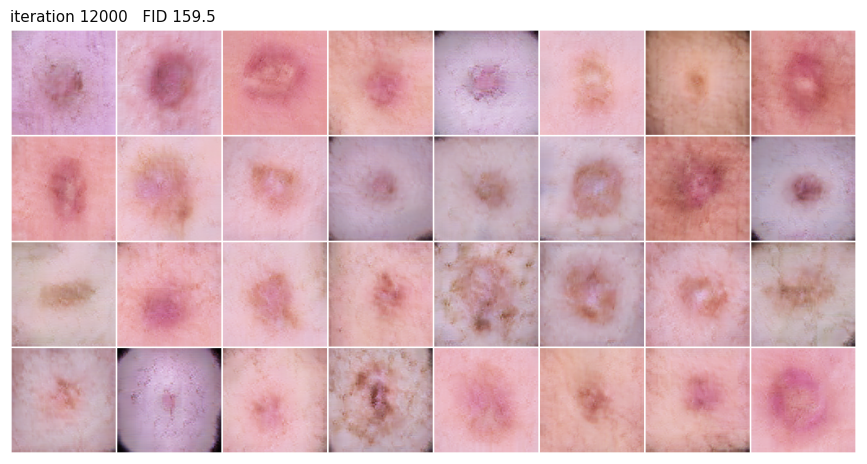

it  12000/20000 | D 1.807 G 0.223 | r_t 0.48 | FID 159.5 | 30.5 min, ETA 20.3 min
it  12500/20000 | D 1.807 G 0.232 | r_t 0.47 | 31.8 min, ETA 19.1 min
it  13000/20000 | D 1.800 G 0.225 | r_t 0.48 | 33.0 min, ETA 17.8 min
it  13500/20000 | D 1.802 G 0.233 | r_t 0.48 | 34.3 min, ETA 16.5 min


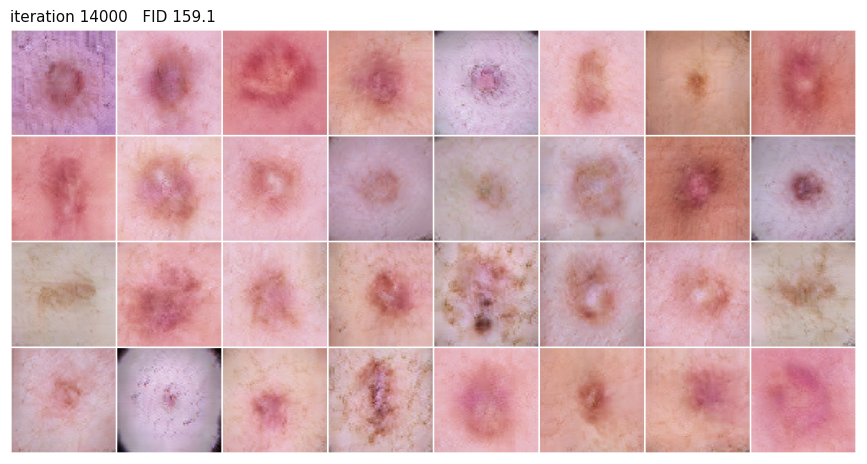

it  14000/20000 | D 1.793 G 0.222 | r_t 0.48 | FID 159.1 | 35.6 min, ETA 15.3 min
it  14500/20000 | D 1.787 G 0.234 | r_t 0.49 | 36.9 min, ETA 14.0 min
it  15000/20000 | D 1.779 G 0.234 | r_t 0.49 | 38.1 min, ETA 12.7 min
it  15500/20000 | D 1.777 G 0.226 | r_t 0.49 | 39.4 min, ETA 11.4 min


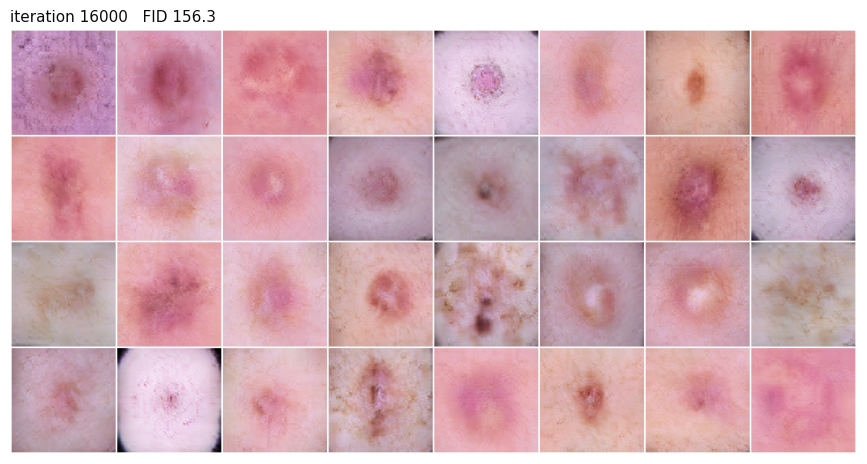

it  16000/20000 | D 1.766 G 0.274 | r_t 0.48 | FID 156.3 | 40.7 min, ETA 10.2 min
it  16500/20000 | D 1.764 G 0.254 | r_t 0.48 | 42.0 min, ETA 8.9 min
it  17000/20000 | D 1.772 G 0.248 | r_t 0.48 | 43.2 min, ETA 7.6 min
it  17500/20000 | D 1.747 G 0.270 | r_t 0.49 | 44.5 min, ETA 6.4 min


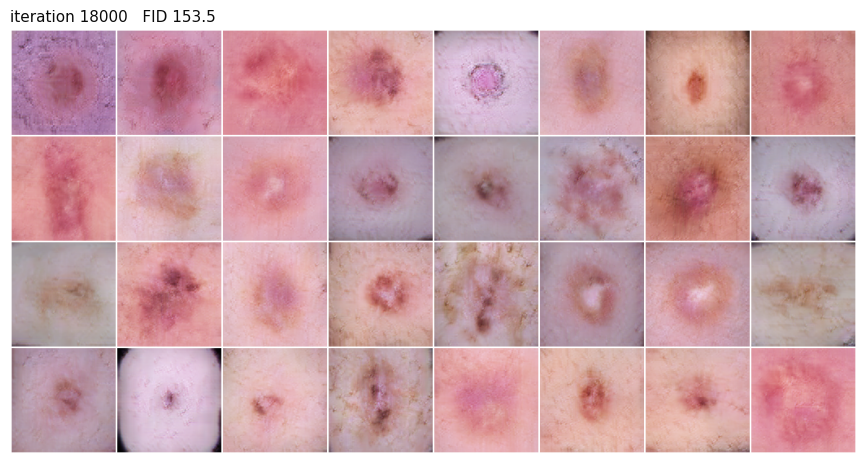

it  18000/20000 | D 1.754 G 0.236 | r_t 0.50 | FID 153.5 | 45.8 min, ETA 5.1 min
it  18500/20000 | D 1.752 G 0.263 | r_t 0.50 | 47.1 min, ETA 3.8 min
it  19000/20000 | D 1.747 G 0.269 | r_t 0.49 | 48.4 min, ETA 2.5 min
it  19500/20000 | D 1.734 G 0.294 | r_t 0.49 | 49.6 min, ETA 1.3 min


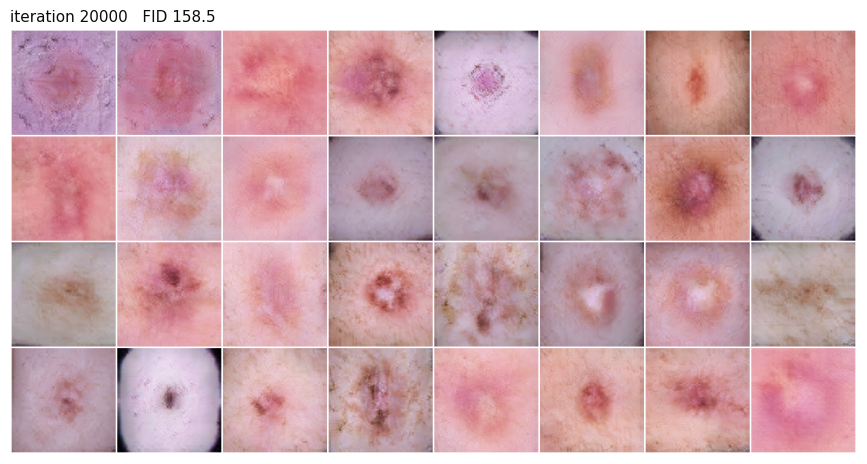

it  20000/20000 | D 1.729 G 0.258 | r_t 0.50 | FID 158.5 | 50.9 min, ETA 0.0 min


In [6]:
GAN_DIR = paths.project_dir / 'models' / f'gan_{RARE}'
RESUME = True          # False = start from scratch (ignores any saved checkpoint)

cfg = GANConfig(img_size=IMG, iters=20000, batch_size=32,
                lr_g=1e-4, lr_d=4e-4, d_steps=2,        # balanced training (see the table at the top)
                eval_every=2000, log_every=500, fid_samples=500, seed=42)
hist = train_gan(cfg, real128, GAN_DIR, DEVICE, fid_ref_features=f_train, resume=RESUME,
                 show=lambda grid, title: show_image(grid, title, width=11))

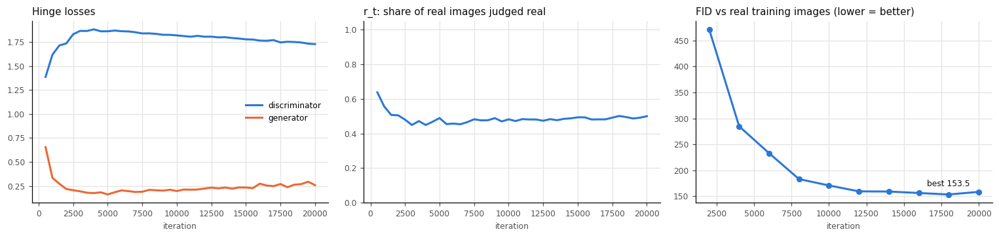

Best generator: iteration 18000, FID 153.5   (real-vs-real reference: 118.2)


In [7]:
plot_gan_history(hist, FIG / 'day3_gan_training.png')
best = torch.load(GAN_DIR / 'G_best.pt', map_location='cpu', weights_only=False)
print(f"Best generator: iteration {best['iter']}, FID {best['fid']:.1f}   (real-vs-real reference: {FID_REAL_REF:.1f})")

**Reading the curves:** the discriminator loss should sit somewhere between ~1.0 and ~1.9 — stuck at exactly 2.0 means the discriminator
has given up, near 0 means it has won. `r_t` should stay below ~0.9 (at 1.0 the discriminator is memorising the 71 images).
FID should fall and then level off.

## 4 · Samples from the best generator

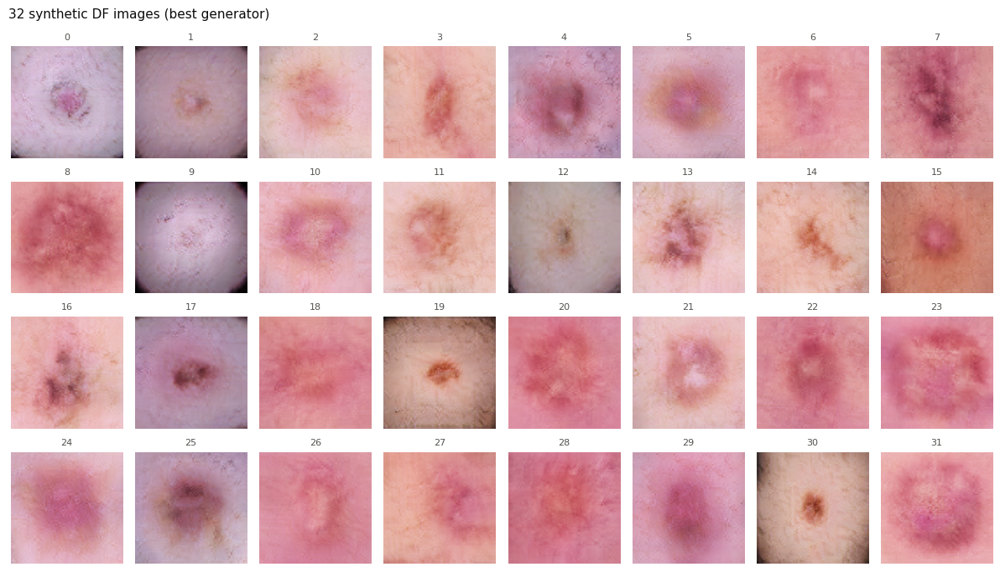

In [8]:
G = load_generator(GAN_DIR / 'G_best.pt', DEVICE)
samples = generate(G, 32, DEVICE, seed=7)
numbered_grid(samples, f'32 synthetic {RARE} images (best generator)', out=FIG / 'day3_gan_samples.png')

## 5 · Generate candidates + memorisation check

With only 71 training images, a GAN can "cheat" by reproducing them. We check how close each generated image is to its
**nearest real training image**, and compare that with how close two *different* real lesions are to each other.

* Blue mostly overlapping or right of orange → the GAN makes **new** images ✅
* Blue piled up near zero → it's **copying** ❌

In [9]:
N_CANDIDATES = 2000
cand = generate(G, N_CANDIDATES, DEVICE, seed=1)
f_cand = inception_features(cand, DEVICE)

d_rr = real_real_nn(f_train, lesions)
d_gr, nn_idx = gen_real_nn(f_cand, f_train)
print(f'Median distance  generated → nearest real: {np.median(d_gr):.3f}')
print(f'Median distance  real → nearest real of another lesion: {np.median(d_rr):.3f}')
print(f'Candidates closer to a real image than 95% of real lesions are to each other: {(d_gr < np.percentile(d_rr, 5)).mean():.1%}')

Median distance  generated → nearest real: 0.625
Median distance  real → nearest real of another lesion: 0.571
Candidates closer to a real image than 95% of real lesions are to each other: 1.7%


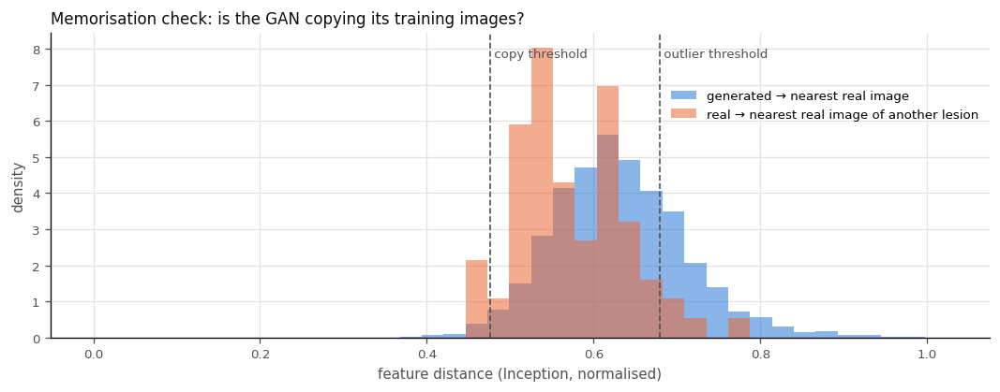

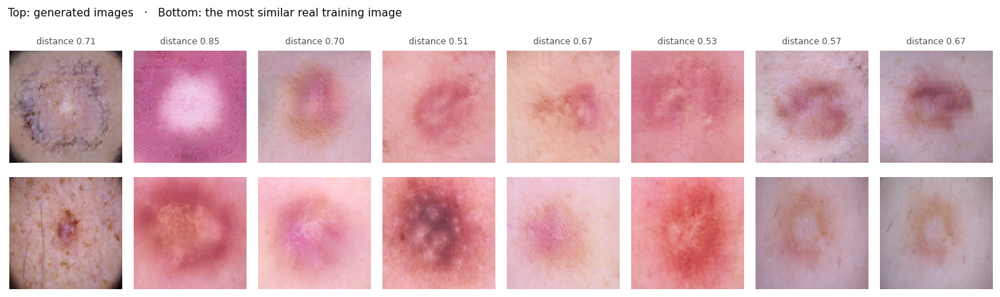

In [10]:
chosen, cand_info, thr = select_synthetic(f_cand, f_train, lesions, n_keep=500, copy_pct=5, drop_far_frac=0.25, seed=42)
plot_nn_distances(d_rr, d_gr, thr, FIG / 'day3_memorisation_check.png')
show_nn_pairs(cand, real128, nn_idx, d_gr, FIG / 'day3_nearest_real_pairs.png', n=8)

## 6 · Filter the candidates → 500 synthetic images

Two-sided automatic filter:
* **copies** — closer to a real training image than almost any two real lesions are to each other → removed (they add nothing new)
* **outliers** — the 25 % of the remaining candidates farthest from every real image → removed (most likely broken)

Then 500 are drawn at random from what's left (keeps the variety). Below are examples of what was removed, then the first 48 kept images.

,candidates
status,
kept,974
selected,500
outlier,492
copy,34


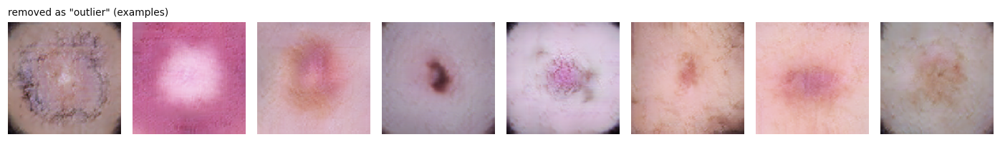

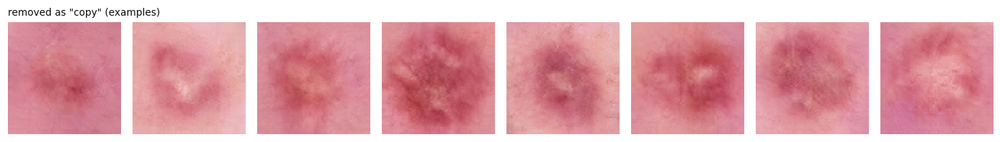

In [11]:
display(cand_info.status.value_counts().rename('candidates').to_frame())
for status in ['outlier', 'copy']:
    idx = cand_info.index[cand_info.status == status][:8].to_numpy()
    if len(idx):
        image_rows([cand[idx]], [f'removed as "{status}" (examples)'])

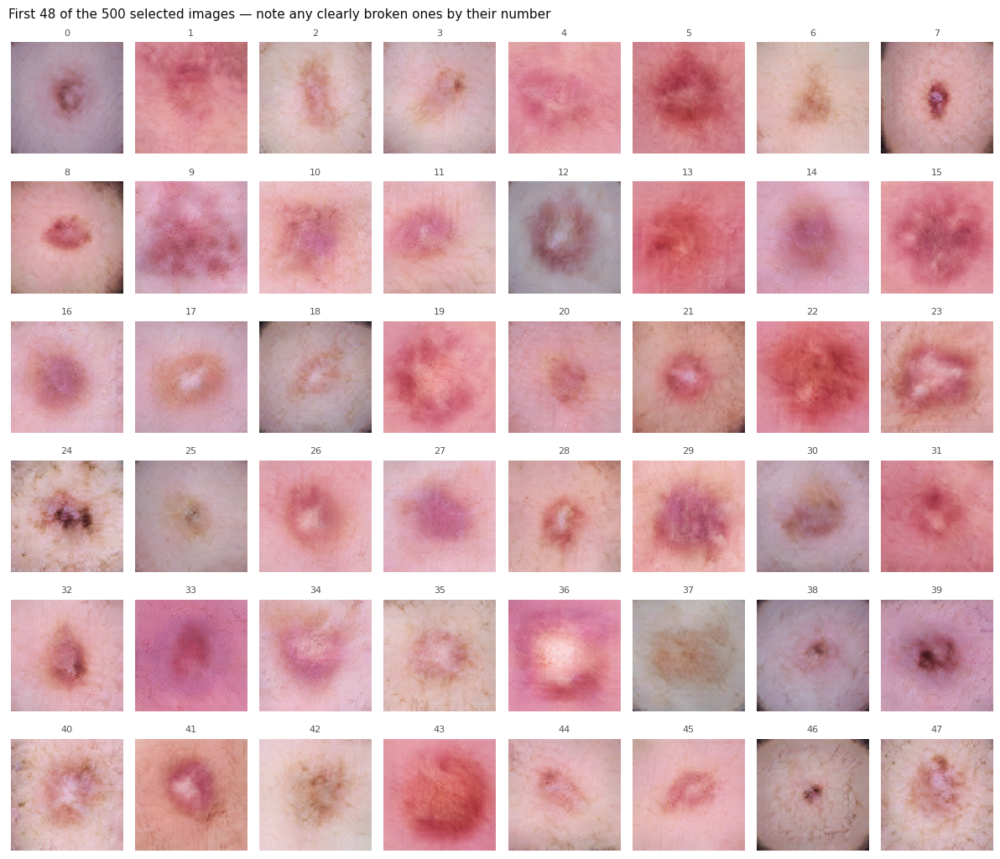

In [12]:
numbered_grid(cand[chosen[:48]], 'First 48 of the 500 selected images — note any clearly broken ones by their number',
              out=FIG / 'day3_selected_examples.png')

### Manual check (optional)

Look at the grid above. If any image is clearly broken (not skin-like, strong artefacts), put its number in the list below
and re-run this cell and the ones after it — it gets swapped for another good candidate. Leave the list empty if all look fine.

In [13]:
MANUAL_REJECT = []          # e.g. [3, 17, 40]

chosen_final, info_final = replace_rejected(chosen, cand_info, MANUAL_REJECT)   # re-runnable: starts from the automatic selection
if MANUAL_REJECT:
    numbered_grid(cand[chosen_final[:48]], 'After manual replacement')
synthetic128 = cand[chosen_final]
print(f'Final synthetic set: {len(synthetic128)} images | manually replaced: {len(MANUAL_REJECT)}')

Final synthetic set: 500 images | manually replaced: 0


## 7 · Save the synthetic images (used on Day 4 and by the app)

Saved at 128 px (native) and upscaled to 224 px (the classifier's input size), plus a provenance table recording, for every
image, its nearest real training image and distance.

In [14]:
syn_dir = paths.project_dir / 'data' / 'synthetic'
syn_dir.mkdir(parents=True, exist_ok=True)
synthetic224 = resize_uint8(synthetic128, 224)
np.save(syn_dir / f'gan_{RARE}_500_128.npy', synthetic128)
np.save(syn_dir / f'gan_{RARE}_500.npy', synthetic224)

prov = info_final.loc[chosen_final].copy()
prov['nearest_real_image_id'] = train_rare.image_id.to_numpy()[prov.nearest_real_pos]
prov.drop(columns='nearest_real_pos').to_csv(syn_dir / f'gan_{RARE}_500_provenance.csv', index=False)
print('Saved:', syn_dir / f'gan_{RARE}_500.npy', synthetic224.shape)

Saved: /content/drive/MyDrive/rare-disease-aug/data/synthetic/gan_DF_500.npy (500, 224, 224, 3)


## 8 · FID: how realistic are the synthetic images?

All sets are compared with the 71 real training images, at 128 px.
* **FID (all)** uses every image in the set.
* **FID (size-matched)** uses random subsets of the same size as the real held-out reference, so every row is compared on equal terms — **this is the column to compare**.

⚠️ **Read FID together with the memorisation check.** FID here is measured against the *training* images, so a set that simply
copies them would score very well. SMOTE blends are made *from* the training images, so a low SMOTE FID mostly means
"close to the originals", not "realistic new lesions". The GAN's goal is a reasonably low FID **and** images that are not copies.

In [15]:
rows = [{'image set': f'Real held-out {RARE} (reference)', 'n': N_REF,
         'FID (all)': FID_REAL_REF, 'FID (size-matched)': FID_REAL_REF, '± sd': 0.0}]

def add_row(name, feats):
    m, s = matched_fid(feats, f_train, N_REF, draws=10)
    rows.append({'image set': name, 'n': len(feats), 'FID (all)': fid_from_features(feats, f_train),
                 'FID (size-matched)': m, '± sd': s})

f_selected = f_cand[chosen_final]
add_row('GAN — filtered (final 500)', f_selected)
add_row('GAN — unfiltered (first 500 candidates)', f_cand[:500])
smote_file = syn_dir / f'smote_{RARE}_500.npy'
if smote_file.exists():
    add_row('SMOTE blends (Day 2)', inception_features(resize_uint8(np.load(smote_file), IMG), DEVICE))

fid_table = pd.DataFrame(rows).set_index('image set').round(1)
fid_table.to_csv(paths.results_dir / 'gan_fid.csv')
display(fid_table)

,n,FID (all),FID (size-matched),± sd
image set,,,,
Real held-out DF (reference),44,118.2,118.2,0.0
GAN — filtered (final 500),500,147.3,168.8,4.7
GAN — unfiltered (first 500 candidates),500,156.9,181.1,4.1
SMOTE blends (Day 2),500,30.1,65.2,4.1


## 9 · Real vs synthetic, side by side

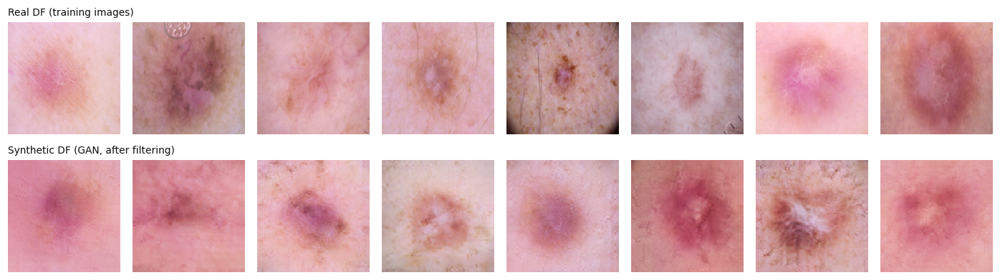

{
  "rare_class": "DF",
  "gan_training_images": 71,
  "image_size": 128,
  "best_iteration": 18000,
  "best_fid_all_500": 153.5,
  "fid_reference_real_vs_real": 118.17,
  "candidates": 2000,
  "filter_counts": {
    "kept": 974,
    "selected": 500,
    "outlier": 492,
    "copy": 34
  },
  "manual_rejects": 0,
  "median_nn_distance_generated": 0.6245,
  "median_nn_distance_real_real": 0.5708
}


In [16]:
rng = np.random.default_rng(3)
image_rows([real128[rng.choice(len(real128), 8, replace=False)], synthetic128[rng.choice(len(synthetic128), 8, replace=False)]],
           [f'Real {RARE} (training images)', f'Synthetic {RARE} (GAN, after filtering)'], out=FIG / 'day3_real_vs_synthetic.png')

summary = {
    'rare_class': RARE, 'gan_training_images': int(len(real128)), 'image_size': IMG,
    'best_iteration': int(best['iter']), 'best_fid_all_500': round(float(best['fid']), 2),
    'fid_reference_real_vs_real': round(FID_REAL_REF, 2),
    'candidates': N_CANDIDATES, 'filter_counts': info_final.status.value_counts().to_dict(),
    'manual_rejects': len(MANUAL_REJECT),
    'median_nn_distance_generated': round(float(np.median(d_gr)), 4),
    'median_nn_distance_real_real': round(float(np.median(d_rr)), 4),
}
(paths.results_dir / 'gan_summary.json').write_text(json.dumps(summary, indent=2))
print(json.dumps(summary, indent=2))

## ✅ Day 3 checklist

`File → Download → Download .ipynb` and send it back. I'll check:

* the sample grids improve over training and don't show mode collapse (many identical images)
* the memorisation check — the GAN makes new images rather than copies
* the FID table — how close the GAN gets to the real-vs-real reference, and how it compares with SMOTE

Day 4 (the main experiment: classifier + these 500 GAN images) starts after that check.